# Imports

In [ ]:
import os
import sys
import glob

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Run from the repo root so the relative data/ paths resolve.
REPO_ROOT = os.path.abspath(os.path.join(os.getcwd(), '..', '..'))
if os.path.basename(os.getcwd()) == '2026_paper':
    os.chdir(REPO_ROOT)
print('Working dir:', os.getcwd())

# Shared MRI loader (handles DICOM series / .nii.gz / .npz).
sys.path.append(os.path.join(REPO_ROOT, 'src'))
sys.path.append(os.path.join(REPO_ROOT, 'src', 'utils'))
from base_mri import load_mri  # noqa: E402

Working dir: /home/lucasthim/projects/phd/mmml-alzheimer-diagnosis


In [15]:
# ===== Config: data roots & reference tables =====
RAW_REFERENCE     = 'data/reference/DOWNLOAD_RAW_MRI.csv'                                    # image_data_id -> raw scan
PREPROCESSED_ROOT = '/mnt/d/lucas/Downloads/preprocessed'                                   # dated 3D .nii.gz run folders
PROCESSED_ROOT    = 'data/mri/processed/storage'                                            # 2D .npz slices, per image
LABEL_REFERENCE   = 'data/reference/PROCESSED_MRI_REFERENCE_ALL_ORIENTATIONS_20260710_1413.csv'

RAW_REF   = pd.read_csv(RAW_REFERENCE)
LABEL_REF = pd.read_csv(LABEL_REFERENCE) if os.path.exists(LABEL_REFERENCE) else None


# ===== Path building =====
def get_label(image_data_id):
    """Diagnosis (MACRO_GROUP) for an image id, from the processed MRI reference; None if unknown."""
    if LABEL_REF is None:
        return None
    hit = LABEL_REF.loc[LABEL_REF['IMAGE_DATA_ID'] == image_data_id, 'MACRO_GROUP']
    return hit.iloc[0] if len(hit) else None


def build_paths(image_data_id):
    """Resolve raw / preprocessed / processed locations for an ADNI image id (e.g. 'I94615').

    raw          : from DOWNLOAD_RAW_MRI.csv -> `.nii`: PATH/IMAGE_NAME | DICOM: the I<id> folder.
    preprocessed : globbed as <root>/*/ADNI_<subject>_<id>.nii.gz across the dated run folders.
    processed    : the per-image storage folder holding the 2D .npz slices.
    """
    hits = RAW_REF[RAW_REF['IMAGE_DATA_ID'] == image_data_id]
    if hits.empty:
        raise ValueError(f'{image_data_id!r} not found in {RAW_REFERENCE}')
    row = hits.iloc[0]
    subject, fmt = row['SUBJECT'], str(row['FORMAT']).lower()
    raw_path = row['PATH'] if fmt == 'dcm' else os.path.join(row['PATH'], row['IMAGE_NAME'])
    prep = sorted(glob.glob(os.path.join(PREPROCESSED_ROOT, '*', f'ADNI_{subject}_{image_data_id}.nii.gz')))
    return {
        'image_data_id': image_data_id,
        'subject': subject,
        'format': fmt,
        'label': get_label(image_data_id),
        'raw_path': raw_path,
        'preprocessed_path': prep[0] if prep else None,
        'processed_dir': os.path.join(PROCESSED_ROOT, image_data_id),
    }


# ===== Array helpers =====
def to_numpy(img):
    """ANTsImage or ndarray -> ndarray."""
    return img.numpy() if hasattr(img, 'numpy') else np.asarray(img)


# def slice_2d(vol, orientation, index):
#     """2D slice using the pipeline's orientation convention (matches mri_augmentation.slice_image)."""
#     vol = to_numpy(vol)
#     if orientation == 'axial':
#         return np.rot90(vol, k=3, axes=(0, 1))[:, :, index]
#     if orientation == 'coronal':
#         return np.rot90(vol, k=3, axes=(0, 2))[:, index, :]
#     if orientation == 'sagittal':
#         rot = np.rot90(vol, k=3, axes=(1, 2))
#         return np.rot90(rot, k=2, axes=(0, 2))[index, :, :]
#     raise ValueError(f'unknown orientation: {orientation!r}')

def slice_2d(image_3d,orientation,orientation_slice):
    
    '''
    
    Slice a 3D image and create a 2D image.
    
    Since ANTsImage to Numpy convertion makes the image lose the reference, we rotate it some times to the correct the axis visualization.
    
    Axis orientation:
    0 - Sagittal
    1 - Coronal
    2 - Axial
    
    Parameters
    ----------
    
    
    image_3d: 3D MRI object in memory
    
    orientation: Orientation to cut the image. Values can be "coronal", "sagittal" or "axial"
    
    orientation_slice: Point to slice the 3D image. Values range from 0 to 100. TODO: fix future bug if sampling_range is outside of the image
    Returns
    ----------
    Returns a 2D image.
    
    '''
    image_3d = to_numpy(image_3d)
    if orientation == 'sagittal':
        rot = np.rot90(image_3d, k=3, axes=(1,2)).copy()
        rot = np.rot90(rot, k=2, axes=(0,2)).copy()
        return rot[orientation_slice,:,:]
    
    elif orientation == 'coronal':
        rot = np.rot90(image_3d, k=3, axes=(0,2)).copy()
        return rot[:,orientation_slice,:]
    
    elif orientation == 'axial':
        rot = np.rot90(image_3d, k=3, axes=(0,1)).copy()        
        return rot[:,:,orientation_slice]

# ===== Visualization =====
def show_orthogonal(vol, title='', slices=None):
    """Show axial / coronal / sagittal slices of a 3D volume.

    slices: optional dict {orientation: index}; any omitted orientation uses the mid-slice.
            e.g. slices={'axial': 8} to inspect the exact slice the pipeline cut.
    """
    vol = to_numpy(vol)
    # mids = {'axial': vol.shape[2] // 2, 'coronal': vol.shape[1] // 2, 'sagittal': vol.shape[0] // 2}
    mids = {'axial': vol.shape[2] // 2, 'coronal': vol.shape[1] // 2, 'sagittal': vol.shape[0] // 2}
    idx = {**mids, **(slices or {})}
    print(f'{title}  shape={vol.shape}  min={vol.min():.3f}  max={vol.max():.3f}  '
          f'mean={vol.mean():.3f}  nonzero={np.count_nonzero(vol)}')
    fig, axes = plt.subplots(1, 3, figsize=(13, 4.5))
    for ax, orient in zip(axes, ['axial', 'coronal', 'sagittal']):
        s = slice_2d(vol, orient, idx[orient])
        ax.imshow(s, cmap='gray')
        ax.set_title(f'{orient} @ {idx[orient]}   ({int((s > 0).sum())} nz px)')
        ax.axis('off')
    fig.suptitle(title, fontsize=13)
    plt.tight_layout()
    plt.show()


def show_volume_from_path(path, title='', slices=None):
    """Load a 3D volume (raw DICOM/.nii or preprocessed .nii.gz) and show its three orientations."""
    if path is None or not os.path.exists(path):
        print(f'[missing volume] {path}')
        return
    show_orthogonal(load_mri(path=path, as_ants=True), title=title, slices=slices)


def show_created_slices(processed_dir, title=''):
    """Display every already-created 2D .npz slice in an image's processed storage folder."""
    paths = sorted(glob.glob(os.path.join(processed_dir, '*.npz')))
    if not paths:
        print(f'No .npz slices found in {processed_dir}')
        return
    ncols = min(len(paths), 3)
    nrows = int(np.ceil(len(paths) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.2 * ncols, 4.2 * nrows))
    axes = np.atleast_1d(axes).ravel()
    for ax, p in zip(axes, paths):
        arr = np.load(p)['arr_0']
        ax.imshow(arr, cmap='gray')
        ax.set_title(f"{os.path.basename(p).replace('.npz', '')}   ({int((arr > 0).sum())} nz px)", fontsize=10)
        ax.axis('off')
    for ax in axes[len(paths):]:
        ax.axis('off')
    fig.suptitle(title or f'Created slices — {os.path.basename(processed_dir)} ({len(paths)} files)', fontsize=13)
    plt.tight_layout()
    plt.show()

In [16]:
# ===== Interactive: rot90(k, axes) explorer =====
import ipywidgets as widgets
import plotly.graph_objects as go
from IPython.display import display

def rot90_slice(vol, k, axis_a, axis_b, remaining, index):
    """np.rot90(vol, k, axes=(axis_a, axis_b)), then index into the remaining axis.

    axis_a == axis_b has no rotation plane, so it falls back to an unrotated slice.
    """
    rotated = vol if axis_a == axis_b else np.rot90(vol, k=k, axes=(axis_a, axis_b))
    idx = [slice(None)] * 3
    idx[remaining] = index
    return rotated[tuple(idx)]


def explore_rotations(vol, title=''):
    """Interactive rot90(k, axes) explorer for a 3D volume (ANTsImage or ndarray).

    Sliders/dropdowns for k, axis a, axis b, and the slice index into the remaining axis.
    Call once per volume to compare several images side by side.
    """
    vol_np = to_numpy(vol)
    axis_options = [(f'{i} (size {vol_np.shape[i]})', i) for i in range(3)]

    k_w      = widgets.IntSlider(value=3, min=0, max=3, step=1, description='k:')
    axis_a_w = widgets.Dropdown(options=axis_options, value=1, description='axis a:')
    axis_b_w = widgets.Dropdown(options=axis_options, value=2, description='axis b:')
    start_remaining = ({0, 1, 2} - {axis_a_w.value, axis_b_w.value}).pop()
    index_w  = widgets.IntSlider(value=vol_np.shape[start_remaining] // 2,
                                  min=0, max=vol_np.shape[start_remaining] - 1, description='index:')
    info_w   = widgets.HTML()

    fig = go.FigureWidget(data=[go.Heatmap(z=np.zeros((2, 2)), colorscale='gray')])
    fig.update_yaxes(autorange='reversed', scaleanchor='x')
    fig.update_layout(width=520, height=520, margin=dict(l=40, r=40, t=50, b=40))

    def update(*_):
        a, b = axis_a_w.value, axis_b_w.value
        same_axis = a == b
        if same_axis and k_w.value != 0:
            k_w.value = 0   # k has no meaning without a rotation plane; the reentrant call finishes the update
            return
        remaining = a if same_axis else ({0, 1, 2} - {a, b}).pop()
        index_w.max = vol_np.shape[remaining] - 1
        index = min(index_w.value, index_w.max)
        s = rot90_slice(vol_np, k_w.value, a, b, remaining, index)
        with fig.batch_update():
            fig.data[0].z = s
            note = '  (axis a == axis b: no rotation, k ignored)' if same_axis else ''
            prefix = f'{title}  ' if title else ''
            fig.layout.title = f'{prefix}k={k_w.value}  axes=({a},{b})  remaining_axis={remaining}  index={index}{note}'
        info_w.value = f'shape={s.shape}   nonzero={int((s > 0).sum())} / {s.size}'

    for w in (k_w, axis_a_w, axis_b_w, index_w):
        w.observe(update, names='value')

    update()
    display(widgets.VBox([widgets.HBox([k_w, axis_a_w, axis_b_w]), index_w, info_w, fig]))

# Reprocessing MRIs


The current results are failing, see below. 


## CNN Results — VGG19_BN (2026-07-10)

Per-slice ROC AUC, computed from the prediction CSVs (`CNN_SCORE` vs `MACRO_GROUP`).

### ADxCN (AD vs CN)

| Orientation/slice | Train | Validation | Test | n (tr/va/te) |
|---|---|---|---|---|
| axial_23    | 0.8473 | 0.6949 | 0.6884 | 3703/291/270 |
| coronal_43  | 0.9841 | 0.8405 | 0.9345 | 3780/294/272 |
| sagittal_26 | 0.9950 | 0.8752 | 0.9094 | 3780/294/272 |

### MCIxCN (MCI vs CN)

| Orientation/slice | Train | Validation | Test | n (tr/va/te) |
|---|---|---|---|---|
| axial_8     | 0.5000 | 0.5000 | 0.5000 | 3842/314/318 |
| coronal_70  | 0.9998 | 0.6726 | 0.6323 | 5114/404/405 |
| sagittal_50 | 0.8822 | 0.6793 | 0.6294 | 5116/404/405 |


> **Note:** `axial_8` collapsed to AUC 0.5 — slice index 8 is at the inferior edge of the
> 100³ volume, so ~1,452 subjects have an empty slice there (dropped) and the rest carry
> little signal. Use a mid-brain axial index (e.g. 23) for a usable MCI axial model.



## Hypotheses

- Skull Stripping is deforming the images
- Registration is deforming the images
- The rotations during the 2D slicing are wrong

## 1 - Checking slices of processed MRIs to see if they match the rotation

In [3]:
IMAGE_DATA_ID = 'I94615'   # <- any id in DOWNLOAD_RAW_MRI.csv. e.g. I1553005 = DICOM CN. (I94615's axial_08 is empty.)

paths = build_paths(IMAGE_DATA_ID)

# Optional manual overrides (uncomment to point at specific files instead of the auto-resolved ones):
# paths['preprocessed_path'] = '/mnt/d/lucas/Downloads/preprocessed/20260709/ADNI_..._I....nii.gz'
# paths['processed_dir']     = 'data/mri/processed/storage/I....'

for k, v in paths.items():
    extra = ''
    if k == 'raw_path':          extra = f"   (exists: {os.path.exists(v)})"
    if k == 'preprocessed_path': extra = f"   (exists: {v is not None and os.path.exists(v)})"
    if k == 'processed_dir':     extra = f"   (n slices: {len(glob.glob(os.path.join(v, '*.npz')))})"
    print(f'{k:20}: {v}{extra}')

image_data_id       : I94615
subject             : 114_S_0173
format              : nii
label               : CN
raw_path            : /mnt/d/lucas/Downloads/raw/ADNI/114_S_0173/MPR__GradWarp__B1_Correction__N3__Scaled/2008-02-14_17_32_54.0/I94615/ADNI_114_S_0173_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080229182339139_S45745_I94615.nii   (exists: True)
preprocessed_path   : /mnt/d/lucas/Downloads/preprocessed/20260707/ADNI_114_S_0173_I94615.nii.gz   (exists: True)
processed_dir       : data/mri/processed/storage/I94615   (n slices: 5)


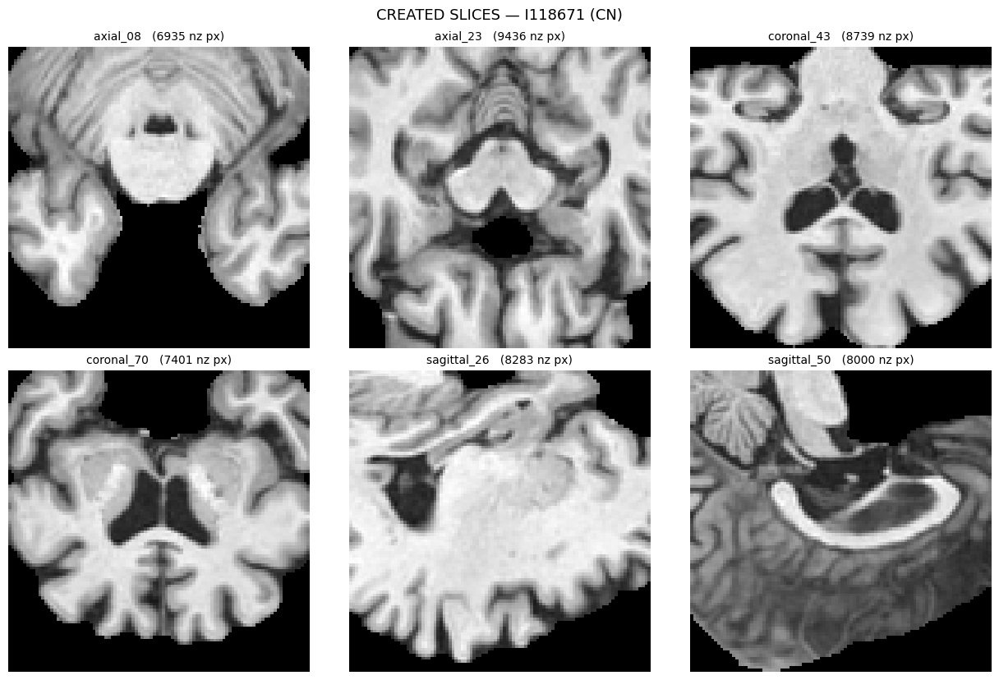

In [18]:
IMAGE_DATA_ID = 'I118671'   # <- any id in DOWNLOAD_RAW_MRI.csv. e.g. I1553005 = DICOM CN. (I94615's axial_08 is empty.)
paths = build_paths(IMAGE_DATA_ID)
show_created_slices(paths['processed_dir'],
                    title=f"CREATED SLICES — {IMAGE_DATA_ID} ({paths['label']})")

PREPROCESSED @ trained slices — I118671  shape=(100, 100, 100)  min=0.000  max=12.324  mean=5.139  nonzero=768941


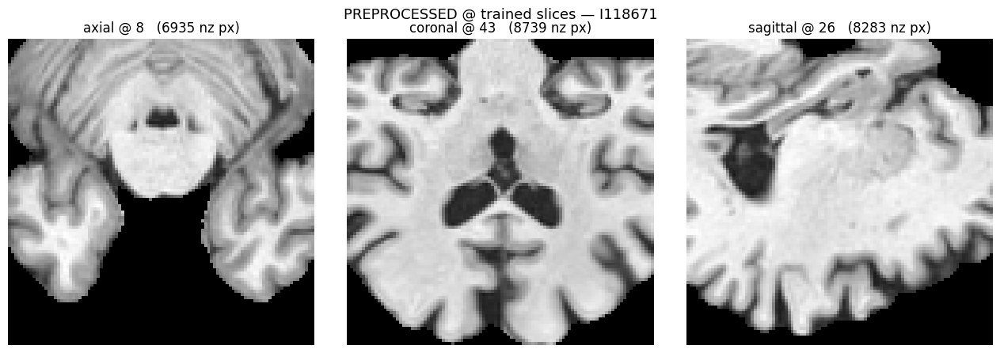

In [20]:
show_volume_from_path(paths['preprocessed_path'],
                      title=f"PREPROCESSED @ trained slices — {IMAGE_DATA_ID}",
                      slices={'axial': 8, 'coronal': 43, 'sagittal': 26})

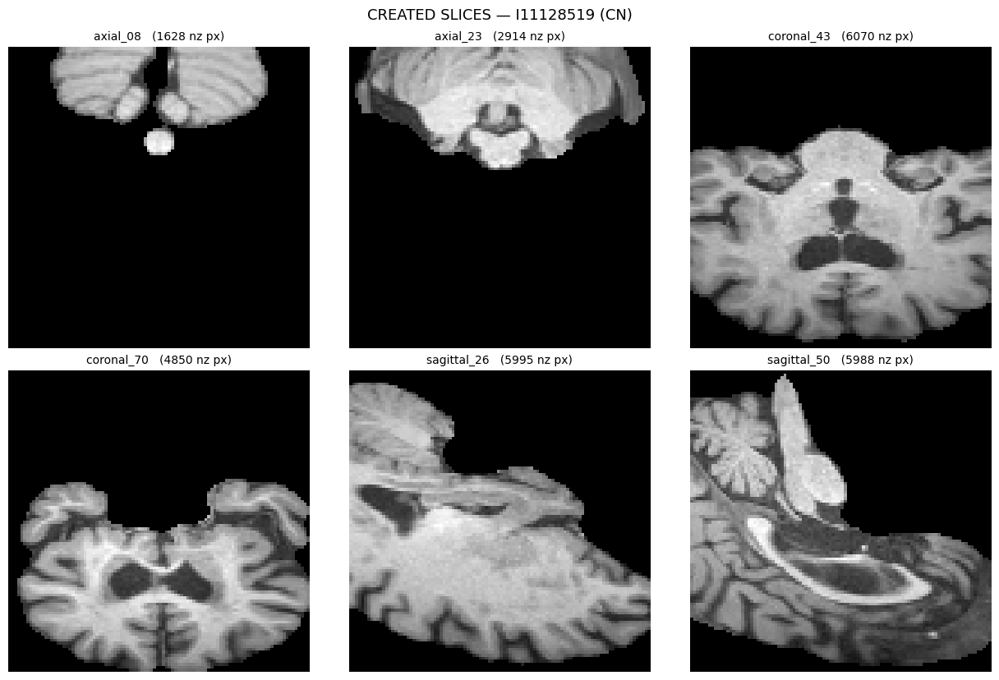

In [ ]:
IMAGE_DATA_ID = 'I11128519'   # <- DICOM image
paths = build_paths(IMAGE_DATA_ID)
show_created_slices(paths['processed_dir'],
                    title=f"CREATED SLICES — {IMAGE_DATA_ID} ({paths['label']})")

PREPROCESSED @ trained slices — I11128519  shape=(100, 100, 100)  min=0.000  max=4.376  mean=1.238  nonzero=550710


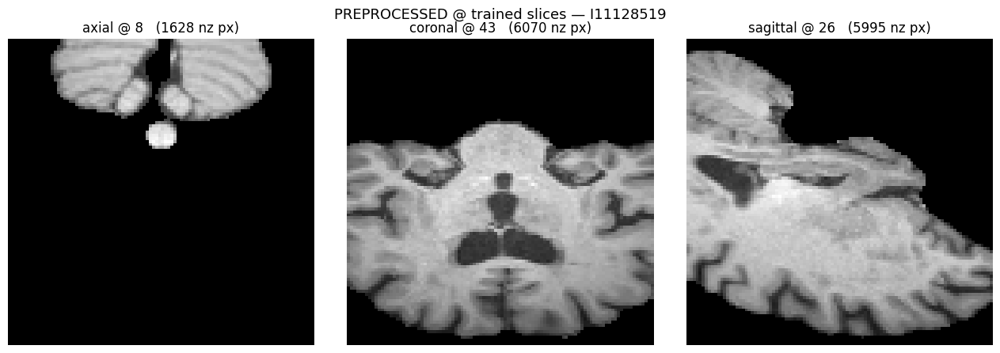

In [16]:
show_volume_from_path(paths['preprocessed_path'],
                      title=f"PREPROCESSED @ trained slices — {IMAGE_DATA_ID}",
                      slices={'axial': 8, 'coronal': 43, 'sagittal': 26})

In [17]:
mri = load_mri(path=paths['preprocessed_path'], as_ants=True)
explore_rotations(mri, title=f'PREPROCESSED — {IMAGE_DATA_ID}')

The slices are upside down, but the orientation seems to be correct. 

Anyhow, I think the rotation in the slices should be corrected, but this will be done later

Also, I think that the DCM images are the problem, they seem to be the deformed ones, not the NiFTi images. 

## 2 - Try to reprocess with a new Atlas and Without skull stripping

In [28]:
# ===== Individual pipeline-step functions, imported directly (not via mri_preprocessing.execute_preprocessing) =====
sys.path.append(os.path.join(REPO_ROOT, 'src', 'data_preprocessing'))

# NOTE: deepbrain_skull_strip.py wants TensorFlow/deepbrain imported before ants (OpenMP deadlock
# risk on macOS per its own comment). Cell 1 already imported `ants` via base_mri, so that ordering
# is unavoidably violated here. Has not been an issue on Linux/WSL2; if the skull-strip cell ever
# hangs, restart the kernel and `import deepbrain_skull_strip` before anything else.
import ants
from mri_standardize import clip_and_normalize_mri
from antspy_registration import register_image_with_atlas, resolve_atlas_path
from deepbrain_skull_strip import deep_brain_skull_stripping
from mri_crop import crop_mri_at_center

print('Registration atlas:', resolve_atlas_path())

Registration atlas: data/mri/atlas/atlas_t1.nii


### Run each pipeline step manually, toggling skull-stripping

`run_pipeline_steps` mirrors [`mri_preprocessing._process_one_image`](../../src/data_preprocessing/mri_preprocessing.py#L68-L105)
exactly (same call sequence: standardize → register → skull-strip → crop), but keeps every
intermediate `ants.ANTsImage` instead of only the final saved volume, so each stage can be
inspected/visualized on its own — and skull-stripping can be toggled without re-running
the (slow) registration step.

In [29]:
def run_pipeline_steps(image_path, skip_skull_stripping=False, box=100, verbose=True):
    """Run the mri_preprocessing pipeline stage-by-stage, keeping every intermediate image.

    Same call sequence as mri_preprocessing._process_one_image; returns each stage instead
    of only the final saved volume.
    """
    stages = {}
    stages['raw'] = load_mri(path=image_path, as_ants=True)
    stages['standardized'] = clip_and_normalize_mri(stages['raw'])
    stages['registered'] = register_image_with_atlas(stages['standardized'])
    stages['stripped'] = (
        deep_brain_skull_stripping(image=stages['registered'], probability=0.5, output_as_array=False)
        if not skip_skull_stripping else stages['registered']
    )
    stages['cropped'] = crop_mri_at_center(image=stages['stripped'], cropping_box=box)

    if verbose:
        for name, img in stages.items():
            print(f'{name:14} shape={img.shape}  spacing={tuple(round(s, 3) for s in img.spacing)}  '
                  f'origin={tuple(round(o, 2) for o in img.origin)}')
    return stages

In [43]:
IMAGE_DATA_ID = 'I94615'   # <- any id in DOWNLOAD_RAW_MRI.csv. Try a DICOM one too, e.g. 'I11128519', to
                            #    compare against the "DCM images seem more deformed" hunch above.
paths = build_paths(IMAGE_DATA_ID)

print('=== WITH skull-stripping ===')
stages_with_strip = run_pipeline_steps(paths['raw_path'], skip_skull_stripping=False)

print('\n=== WITHOUT skull-stripping ===')
stages_without_strip = run_pipeline_steps(paths['raw_path'], skip_skull_stripping=True)

=== WITH skull-stripping ===
Found a total of 0 NaN values in image.
Running DeepBrain Skull Stripping...
DeepBrain skull stripping finished.
raw            shape=(192, 192, 160)  spacing=(1.251, 1.243, 1.201)  origin=(-90.68, -141.59, 108.53)
standardized   shape=(192, 192, 160)  spacing=(1.0, 1.0, 1.0)  origin=(0.0, 0.0, 0.0)
registered     shape=(193, 229, 193)  spacing=(1.0, 1.0, 1.0)  origin=(96.0, 132.0, -74.0)
stripped       shape=(193, 229, 193)  spacing=(1.0, 1.0, 1.0)  origin=(0.0, 0.0, 0.0)
cropped        shape=(100, 100, 100)  spacing=(1.0, 1.0, 1.0)  origin=(-47.0, -65.0, 47.0)

=== WITHOUT skull-stripping ===
Found a total of 0 NaN values in image.
raw            shape=(192, 192, 160)  spacing=(1.251, 1.243, 1.201)  origin=(-90.68, -141.59, 108.53)
standardized   shape=(192, 192, 160)  spacing=(1.0, 1.0, 1.0)  origin=(0.0, 0.0, 0.0)
registered     shape=(193, 229, 193)  spacing=(1.0, 1.0, 1.0)  origin=(96.0, 132.0, -74.0)
stripped       shape=(193, 229, 193)  spacing=(1.0

WITH skull-strip — raw  shape=(192, 192, 160)  min=0.000  max=2218.729  mean=173.616  nonzero=3813222


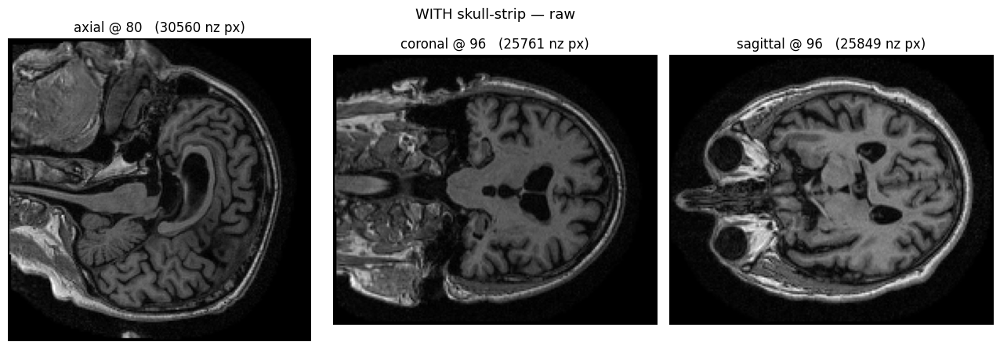

WITH skull-strip — standardized  shape=(192, 192, 160)  min=-0.001  max=12.370  mean=1.885  nonzero=5898240


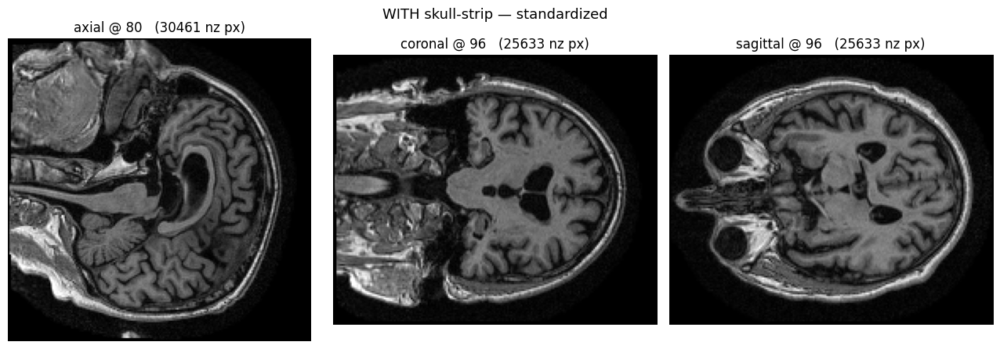

WITH skull-strip — registered  shape=(193, 229, 193)  min=-0.001  max=12.370  mean=1.947  nonzero=7902660


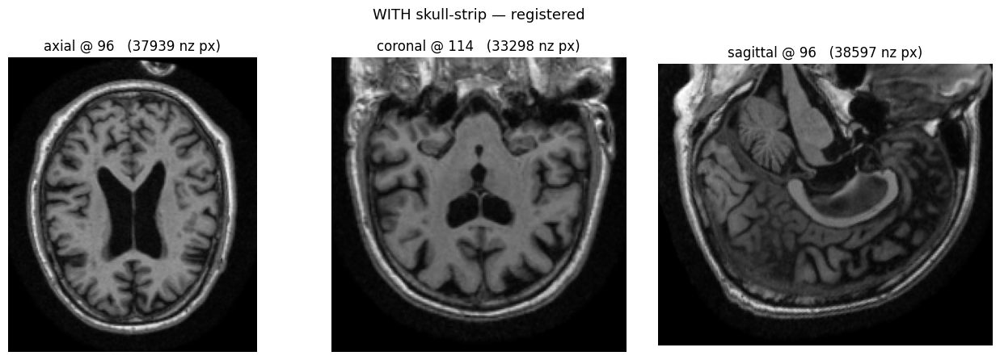

WITH skull-strip — stripped  shape=(193, 229, 193)  min=0.000  max=7.020  mean=0.783  nonzero=1732183


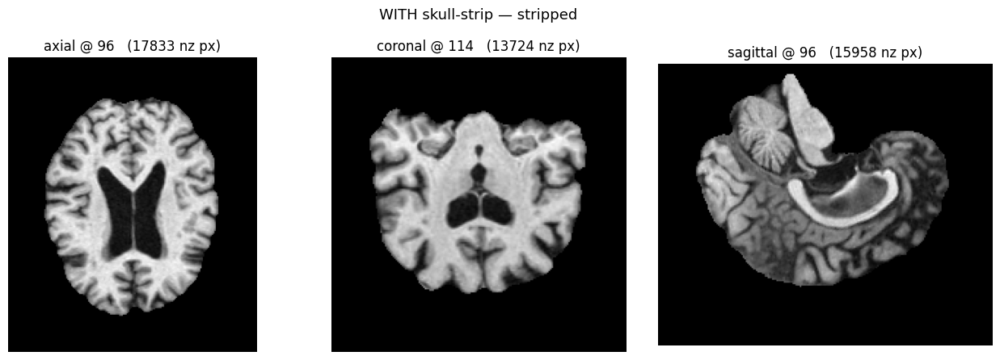

WITH skull-strip — cropped  shape=(100, 100, 100)  min=0.000  max=7.020  mean=3.622  nonzero=932117


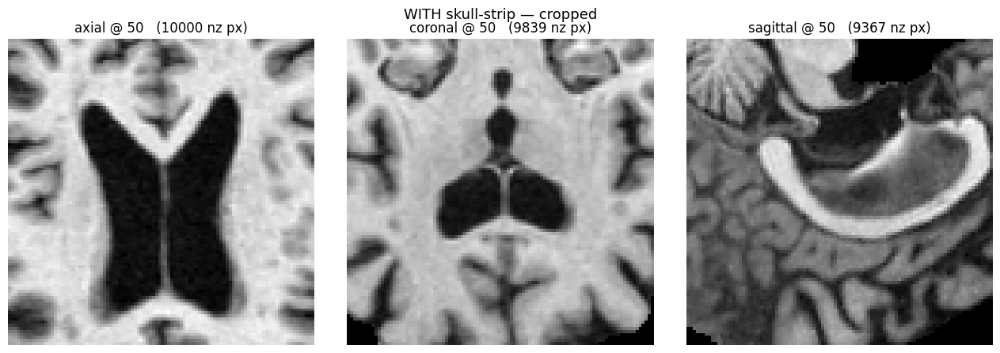

In [31]:
for name, img in stages_with_strip.items():
    show_orthogonal(img, title=f'WITH skull-strip — {name}')

WITHOUT skull-strip — raw  shape=(192, 192, 160)  min=0.000  max=2218.729  mean=173.616  nonzero=3813222


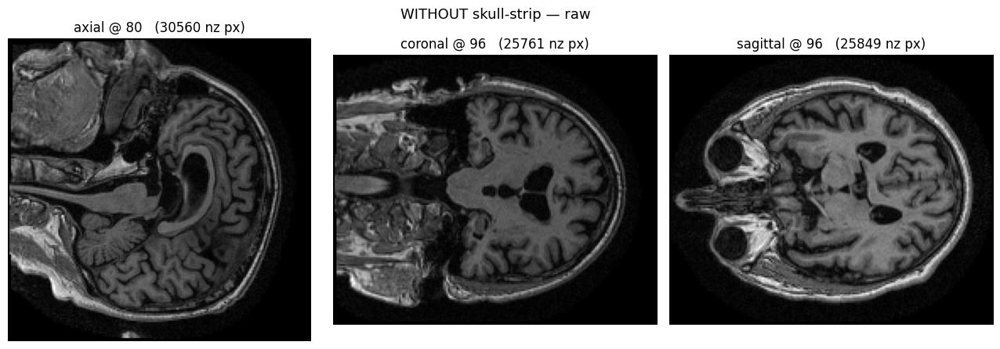

WITHOUT skull-strip — standardized  shape=(192, 192, 160)  min=-0.001  max=12.370  mean=1.885  nonzero=5898240


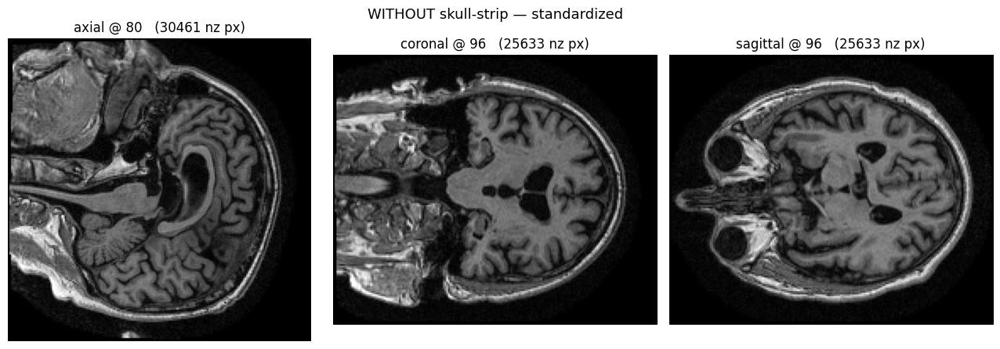

WITHOUT skull-strip — registered  shape=(193, 229, 193)  min=-0.001  max=12.370  mean=1.947  nonzero=7907683


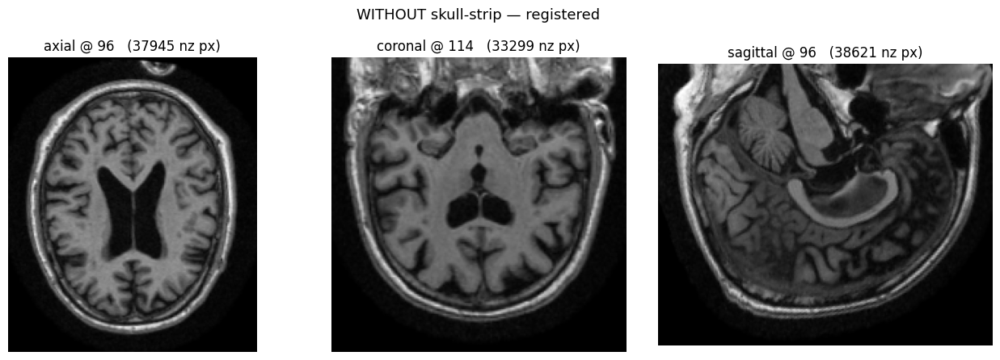

WITHOUT skull-strip — stripped  shape=(193, 229, 193)  min=-0.001  max=12.370  mean=1.947  nonzero=7907683


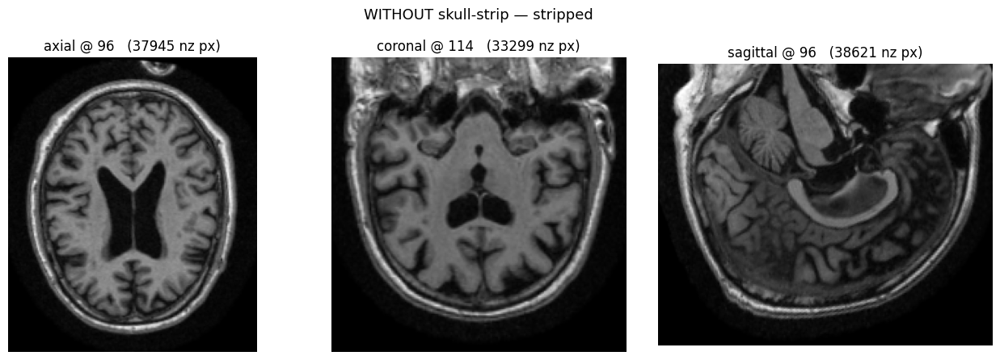

WITHOUT skull-strip — cropped  shape=(100, 100, 100)  min=0.095  max=11.458  mean=3.801  nonzero=1000000


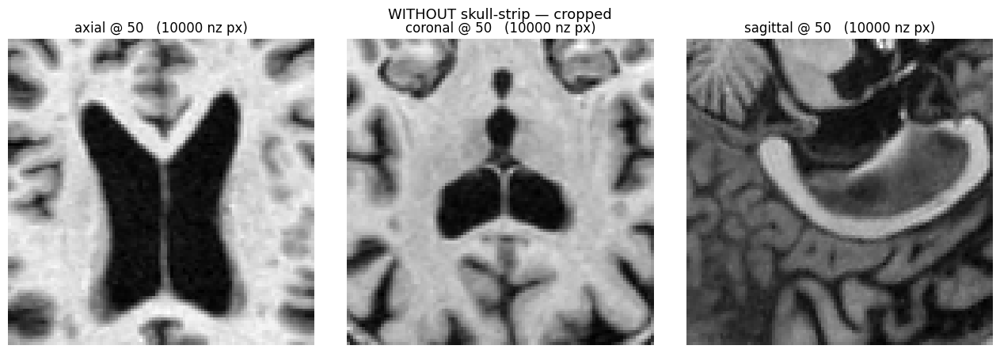

In [32]:
for name, img in stages_without_strip.items():
    show_orthogonal(img, title=f'WITHOUT skull-strip — {name}')

In [33]:
IMAGE_DATA_ID = 'I1553005'   # <- DCM
paths = build_paths(IMAGE_DATA_ID)

print('=== WITH skull-stripping ===')
stages_with_strip = run_pipeline_steps(paths['raw_path'], skip_skull_stripping=False)

print('\n=== WITHOUT skull-stripping ===')
stages_without_strip = run_pipeline_steps(paths['raw_path'], skip_skull_stripping=True)

=== WITH skull-stripping ===
Found a total of 0 NaN values in image.
Running DeepBrain Skull Stripping...
DeepBrain skull stripping finished.
raw            shape=(256, 240, 208)  spacing=(1.0, 1.0, 1.0)  origin=(-100.8, -128.1, 132.41)
standardized   shape=(256, 240, 208)  spacing=(1.0, 1.0, 1.0)  origin=(0.0, 0.0, 0.0)
registered     shape=(193, 229, 193)  spacing=(1.0, 1.0, 1.0)  origin=(96.0, 132.0, -74.0)
stripped       shape=(193, 229, 193)  spacing=(1.0, 1.0, 1.0)  origin=(0.0, 0.0, 0.0)
cropped        shape=(100, 100, 100)  spacing=(1.0, 1.0, 1.0)  origin=(-47.0, -65.0, 47.0)

=== WITHOUT skull-stripping ===
Found a total of 0 NaN values in image.
raw            shape=(256, 240, 208)  spacing=(1.0, 1.0, 1.0)  origin=(-100.8, -128.1, 132.41)
standardized   shape=(256, 240, 208)  spacing=(1.0, 1.0, 1.0)  origin=(0.0, 0.0, 0.0)
registered     shape=(193, 229, 193)  spacing=(1.0, 1.0, 1.0)  origin=(96.0, 132.0, -74.0)
stripped       shape=(193, 229, 193)  spacing=(1.0, 1.0, 1.0)  o

WITH skull-strip — raw  shape=(256, 240, 208)  min=0.000  max=1192.000  mean=92.211  nonzero=12380043


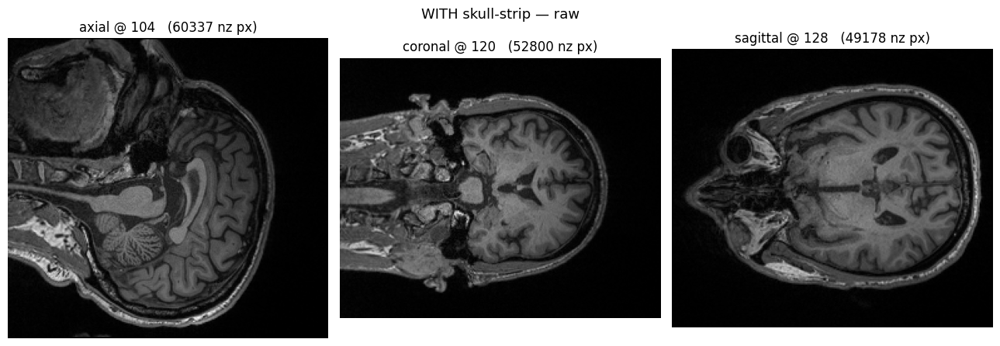

WITH skull-strip — standardized  shape=(256, 240, 208)  min=-0.001  max=7.988  mean=1.000  nonzero=12779520


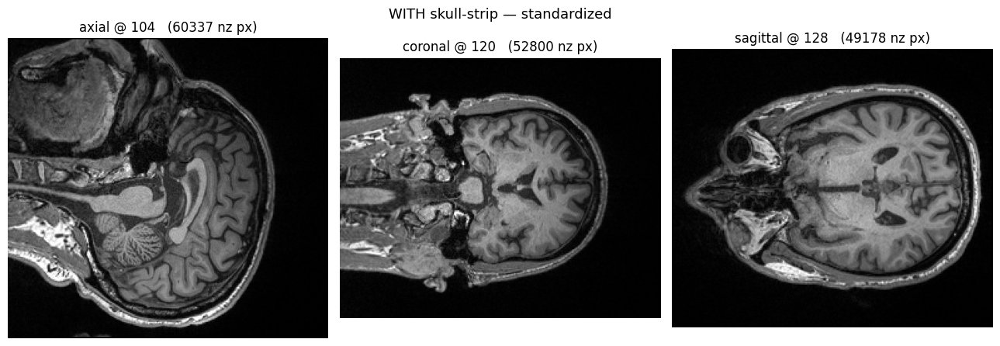

WITH skull-strip — registered  shape=(193, 229, 193)  min=-0.001  max=7.988  mean=1.298  nonzero=7935924


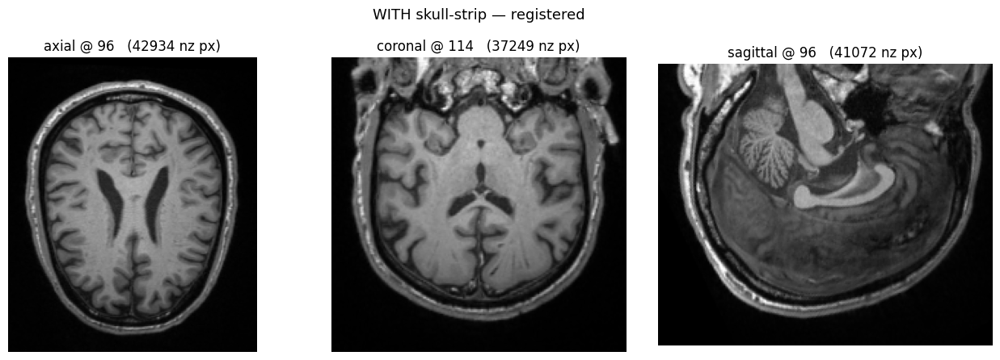

WITH skull-strip — stripped  shape=(193, 229, 193)  min=0.000  max=6.418  mean=0.656  nonzero=1734216


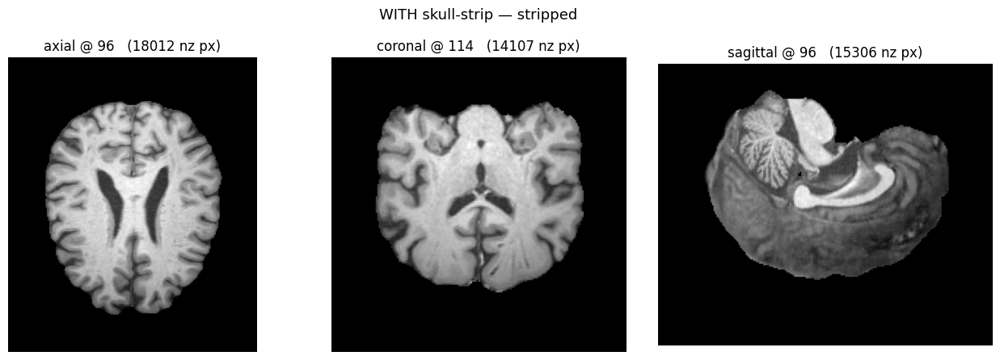

WITH skull-strip — cropped  shape=(100, 100, 100)  min=0.000  max=6.418  mean=3.151  nonzero=927732


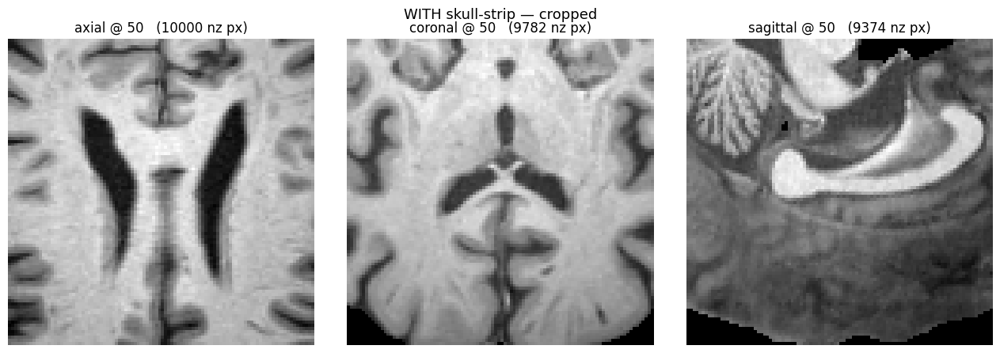

In [34]:
for name, img in stages_with_strip.items():
    show_orthogonal(img, title=f'WITH skull-strip — {name}')

WITHOUT skull-strip — raw  shape=(256, 240, 208)  min=0.000  max=1192.000  mean=92.211  nonzero=12380043


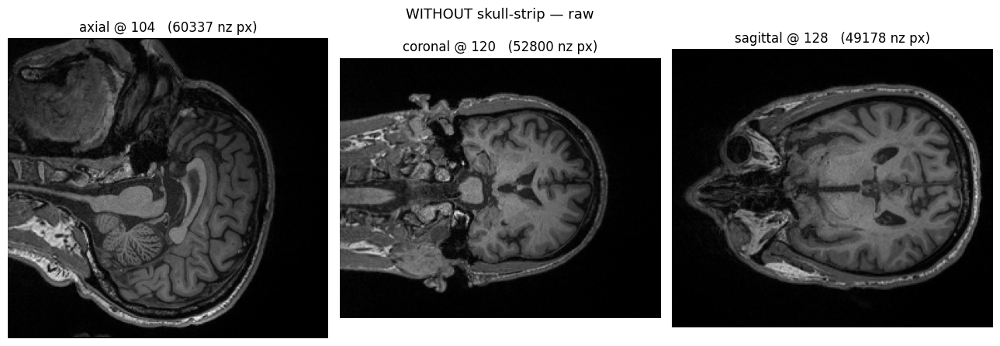

WITHOUT skull-strip — standardized  shape=(256, 240, 208)  min=-0.001  max=7.988  mean=1.000  nonzero=12779520


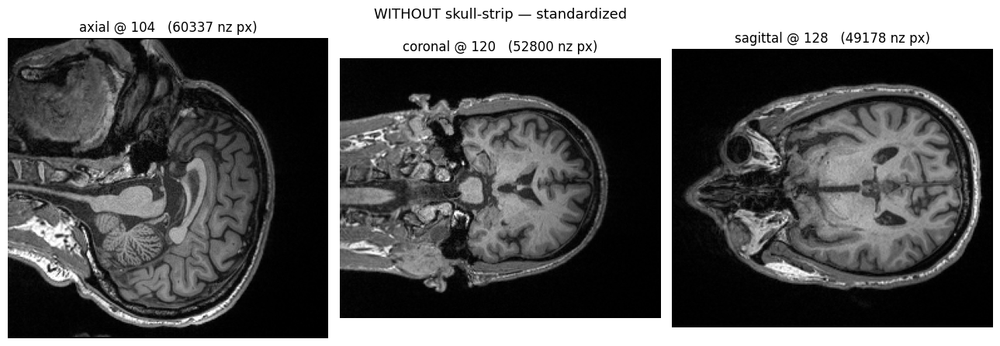

WITHOUT skull-strip — registered  shape=(193, 229, 193)  min=-0.001  max=7.988  mean=1.298  nonzero=7933188


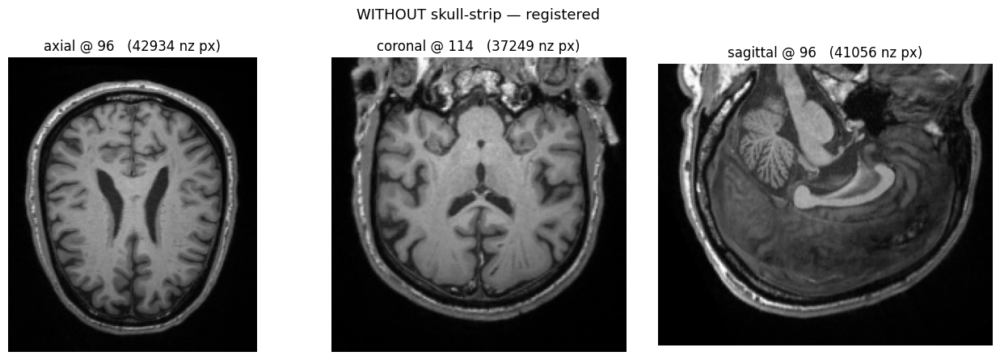

WITHOUT skull-strip — stripped  shape=(193, 229, 193)  min=-0.001  max=7.988  mean=1.298  nonzero=7933188


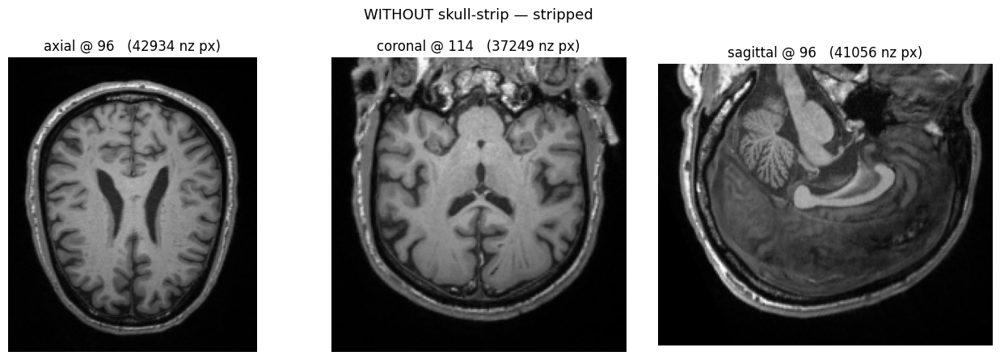

WITHOUT skull-strip — cropped  shape=(100, 100, 100)  min=0.043  max=7.022  mean=3.240  nonzero=1000000


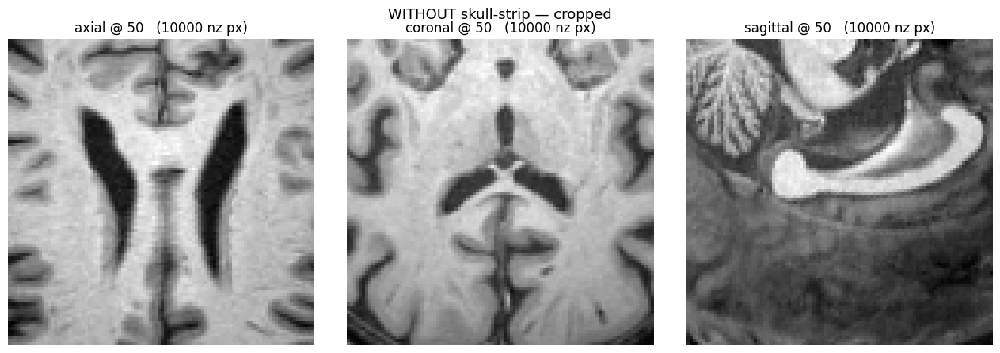

In [35]:
for name, img in stages_without_strip.items():
    show_orthogonal(img, title=f'WITHOUT skull-strip — {name}')

In [36]:

IMAGE_DATA_ID = 'I11128519'   # <- any id in DOWNLOAD_RAW_MRI.csv. Try a DICOM one too, e.g. 'I11128519', to
                            #    compare against the "DCM images seem more deformed" hunch above.
paths = build_paths(IMAGE_DATA_ID)

print('=== WITH skull-stripping ===')
stages_with_strip = run_pipeline_steps(paths['raw_path'], skip_skull_stripping=False)

print('\n=== WITHOUT skull-stripping ===')
stages_without_strip = run_pipeline_steps(paths['raw_path'], skip_skull_stripping=True)

=== WITH skull-stripping ===


ImageSeriesReader (0x109ec4c0): Non uniform sampling or missing slices detected,  maximum nonuniformity:0.0005



Found a total of 0 NaN values in image.
Running DeepBrain Skull Stripping...
DeepBrain skull stripping finished.
raw            shape=(256, 240, 208)  spacing=(1.0, 1.0, 1.0)  origin=(-104.84, -140.46, 81.33)
standardized   shape=(256, 240, 208)  spacing=(1.0, 1.0, 1.0)  origin=(0.0, 0.0, 0.0)
registered     shape=(193, 229, 193)  spacing=(1.0, 1.0, 1.0)  origin=(96.0, 132.0, -74.0)
stripped       shape=(193, 229, 193)  spacing=(1.0, 1.0, 1.0)  origin=(0.0, 0.0, 0.0)
cropped        shape=(100, 100, 100)  spacing=(1.0, 1.0, 1.0)  origin=(-47.0, -65.0, 47.0)

=== WITHOUT skull-stripping ===


ImageSeriesReader (0xf953780): Non uniform sampling or missing slices detected,  maximum nonuniformity:0.0005



Found a total of 0 NaN values in image.
raw            shape=(256, 240, 208)  spacing=(1.0, 1.0, 1.0)  origin=(-104.84, -140.46, 81.33)
standardized   shape=(256, 240, 208)  spacing=(1.0, 1.0, 1.0)  origin=(0.0, 0.0, 0.0)
registered     shape=(193, 229, 193)  spacing=(1.0, 1.0, 1.0)  origin=(96.0, 132.0, -74.0)
stripped       shape=(193, 229, 193)  spacing=(1.0, 1.0, 1.0)  origin=(96.0, 132.0, -74.0)
cropped        shape=(100, 100, 100)  spacing=(1.0, 1.0, 1.0)  origin=(49.0, 67.0, -27.0)


WITH skull-strip — raw  shape=(256, 240, 208)  min=0.000  max=752.000  mean=58.268  nonzero=12779520


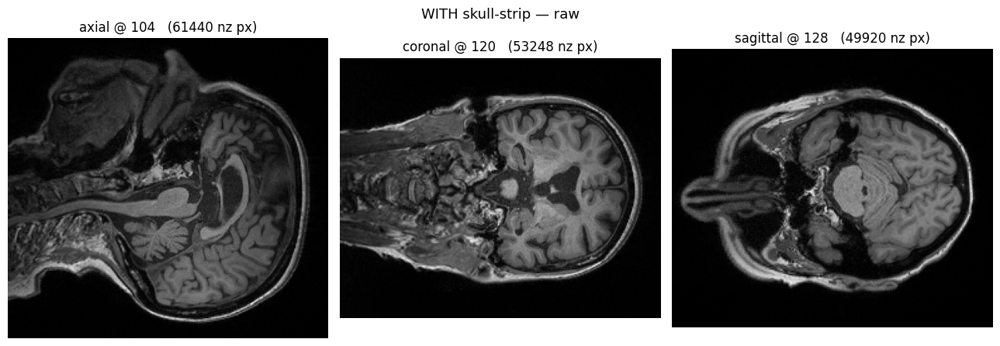

WITH skull-strip — standardized  shape=(256, 240, 208)  min=-0.001  max=5.195  mean=0.632  nonzero=12779520


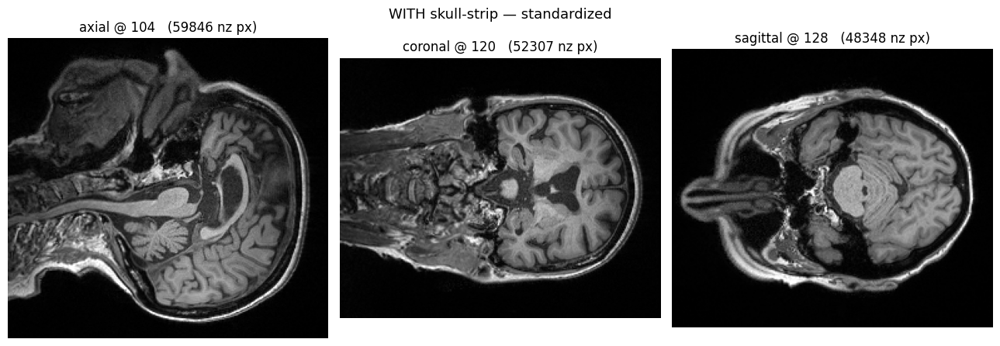

WITH skull-strip — registered  shape=(193, 229, 193)  min=-0.001  max=5.195  mean=0.850  nonzero=7676030


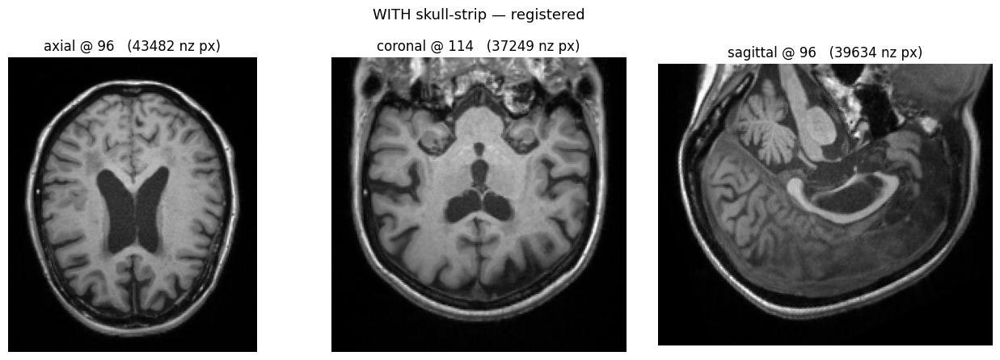

WITH skull-strip — stripped  shape=(193, 229, 193)  min=0.000  max=4.432  mean=0.473  nonzero=1803363


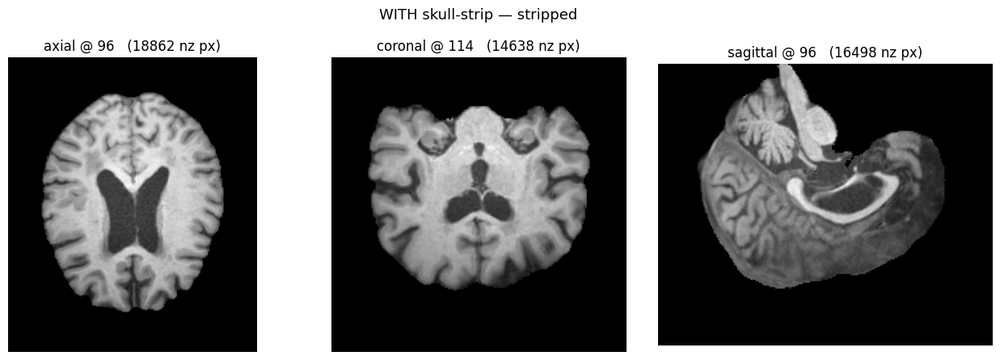

WITH skull-strip — cropped  shape=(100, 100, 100)  min=0.000  max=4.432  mean=2.177  nonzero=931968


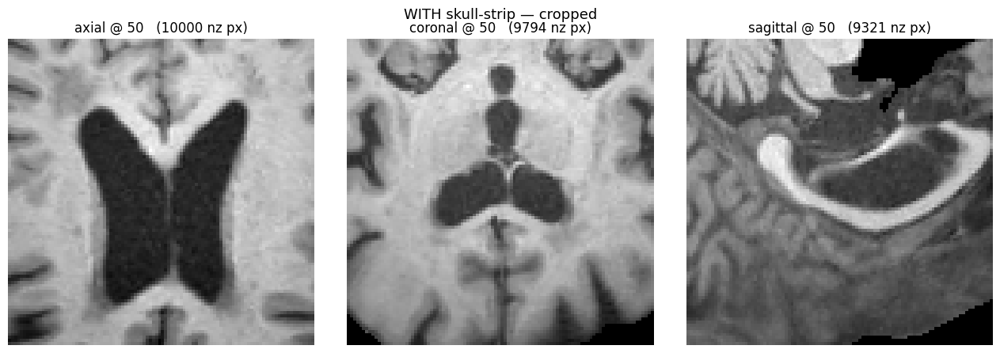

In [37]:
for name, img in stages_with_strip.items():
    show_orthogonal(img, title=f'WITH skull-strip — {name}')

WITHOUT skull-strip — raw  shape=(256, 240, 208)  min=0.000  max=752.000  mean=58.268  nonzero=12779520


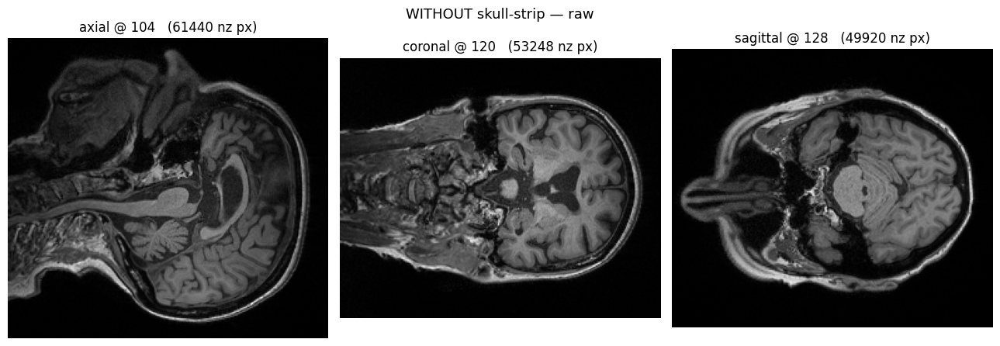

WITHOUT skull-strip — standardized  shape=(256, 240, 208)  min=-0.001  max=5.195  mean=0.632  nonzero=12779520


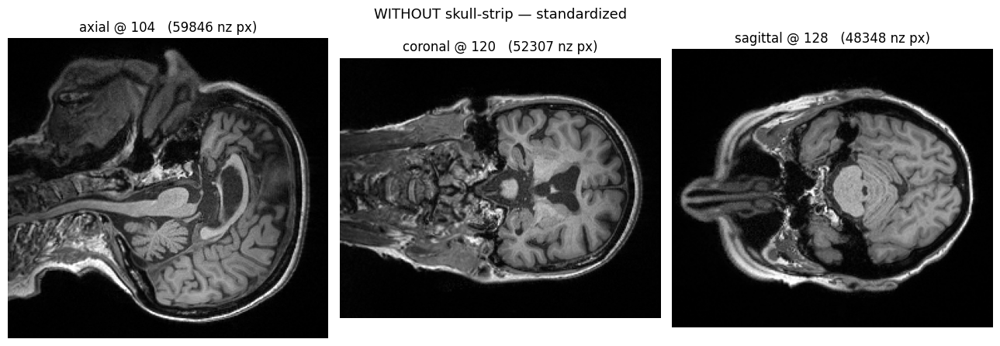

WITHOUT skull-strip — registered  shape=(193, 229, 193)  min=-0.001  max=5.195  mean=0.851  nonzero=7676519


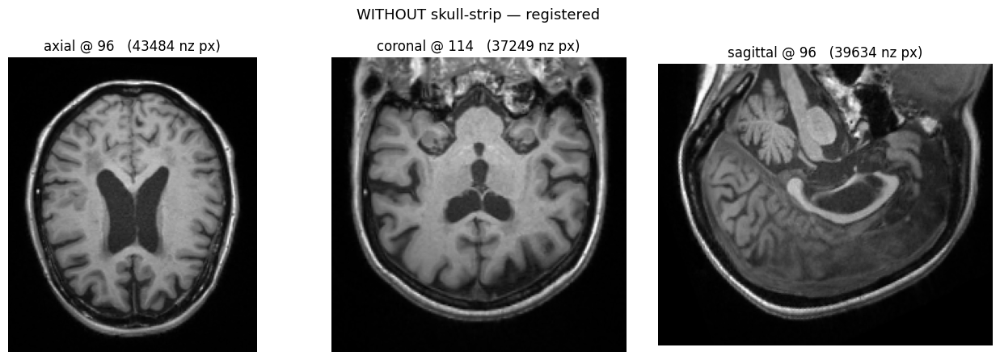

WITHOUT skull-strip — stripped  shape=(193, 229, 193)  min=-0.001  max=5.195  mean=0.851  nonzero=7676519


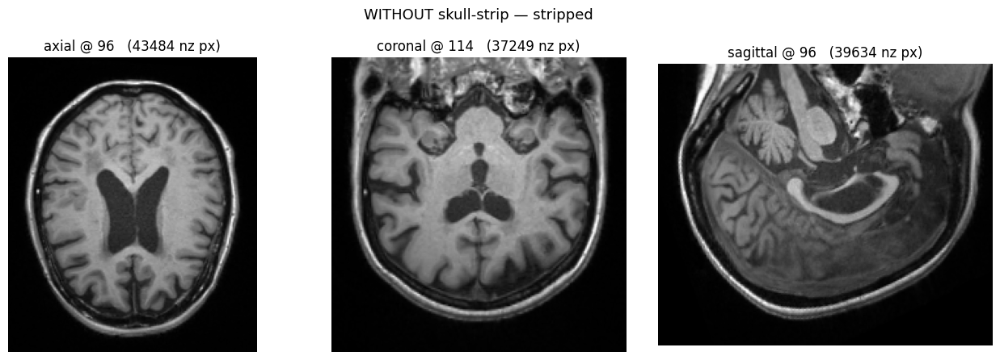

WITHOUT skull-strip — cropped  shape=(100, 100, 100)  min=0.020  max=5.177  mean=2.240  nonzero=1000000


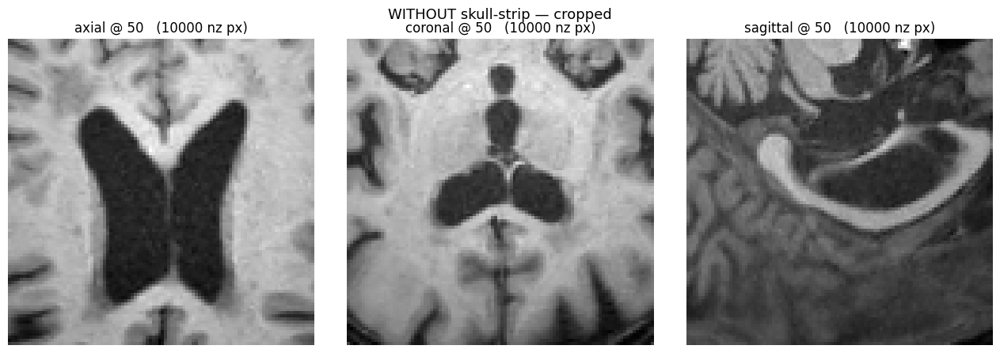

In [38]:
for name, img in stages_without_strip.items():
    show_orthogonal(img, title=f'WITHOUT skull-strip — {name}')

### Third hypothesis found while wiring this up: `standardized`/`stripped` report spacing=(1,1,1), origin=(0,0,0)

Look at the printed diagnostics from `run_pipeline_steps` above — `standardized` and `stripped` report
spacing `(1.0, 1.0, 1.0)` and origin `(0.0, 0.0, 0.0)`, not the real header values `raw` and `registered` show.

Cause: [`clip_and_normalize_mri`](../../src/data_preprocessing/mri_standardize.py#L44) and
[`deep_brain_skull_stripping`](../../src/data_preprocessing/deepbrain_skull_strip.py#L72) both rebuild the
image via `ants.from_numpy(array, direction=...)` — passing `direction` but not `spacing`/`origin`, which
silently defaults them to `(1,1,1)` / `(0,0,0)` (confirmed directly: `ants.from_numpy` without those args
does exactly that).

`clip_and_normalize_mri` runs immediately **before** registration, so `ants.registration()` receives a
*moving* image whose voxel spacing is reported as 1mm isotropic when it's actually ~1.2mm, and whose origin
is reported as the scanner isocenter when it's actually wherever the real acquisition placed it. That's a
direct candidate for "brain shifted" — the optimizer is solving for a transform between the wrong physical
geometries, independent of skull-stripping or the atlas choice.

The cell below re-runs the same steps but restores the real spacing/origin after each rebuild — purely
in-notebook, it does not touch the pipeline source — as a quick way to test whether this alone explains
the shift you're seeing.

ImageSeriesReader (0xf953780): Non uniform sampling or missing slices detected,  maximum nonuniformity:0.0005



Found a total of 0 NaN values in image.
Running DeepBrain Skull Stripping...
DeepBrain skull stripping finished.
raw            shape=(256, 240, 208)  spacing=(1.0, 1.0, 1.0)  origin=(-104.84, -140.46, 81.33)
standardized   shape=(256, 240, 208)  spacing=(1.0, 1.0, 1.0)  origin=(-104.84, -140.46, 81.33)
registered     shape=(193, 229, 193)  spacing=(1.0, 1.0, 1.0)  origin=(96.0, 132.0, -74.0)
stripped       shape=(193, 229, 193)  spacing=(1.0, 1.0, 1.0)  origin=(96.0, 132.0, -74.0)
cropped        shape=(100, 100, 100)  spacing=(1.0, 1.0, 1.0)  origin=(49.0, 67.0, -27.0)
GEOMETRY-FIXED — raw  shape=(256, 240, 208)  min=0.000  max=752.000  mean=58.268  nonzero=12779520


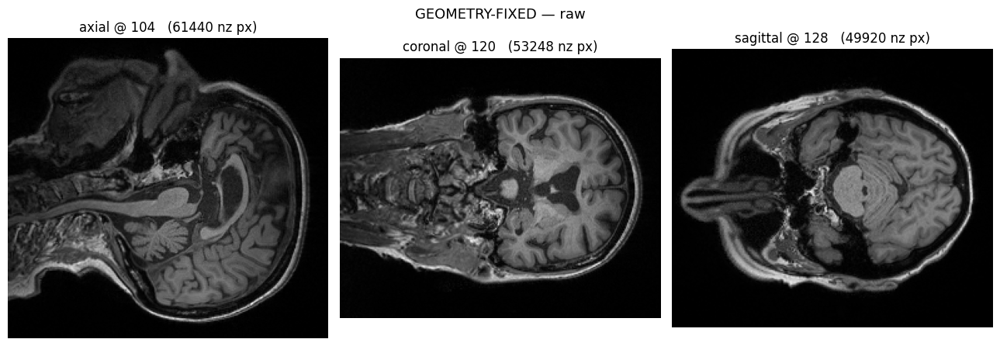

GEOMETRY-FIXED — standardized  shape=(256, 240, 208)  min=-0.001  max=5.195  mean=0.632  nonzero=12779520


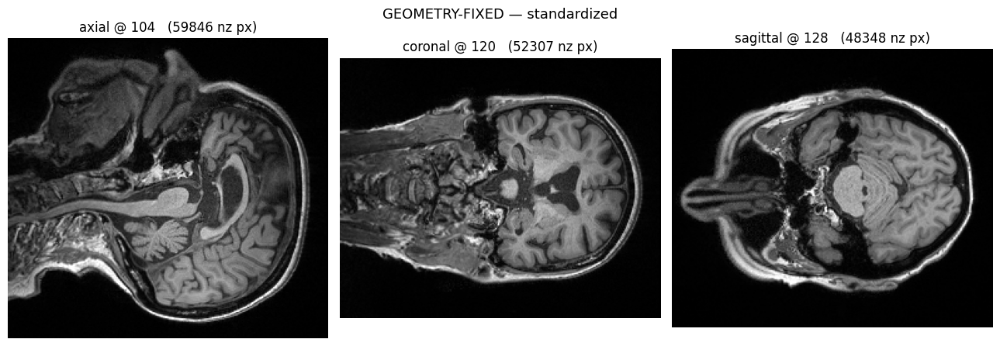

GEOMETRY-FIXED — registered  shape=(193, 229, 193)  min=-0.001  max=5.195  mean=0.851  nonzero=7678604


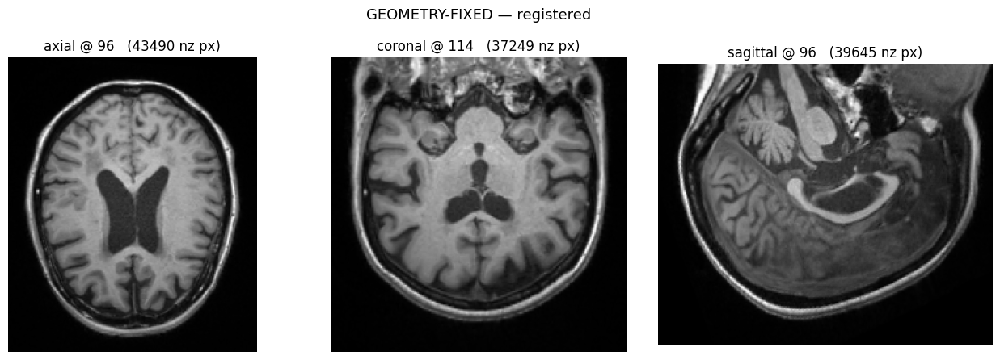

GEOMETRY-FIXED — stripped  shape=(193, 229, 193)  min=0.000  max=4.414  mean=0.473  nonzero=1805008


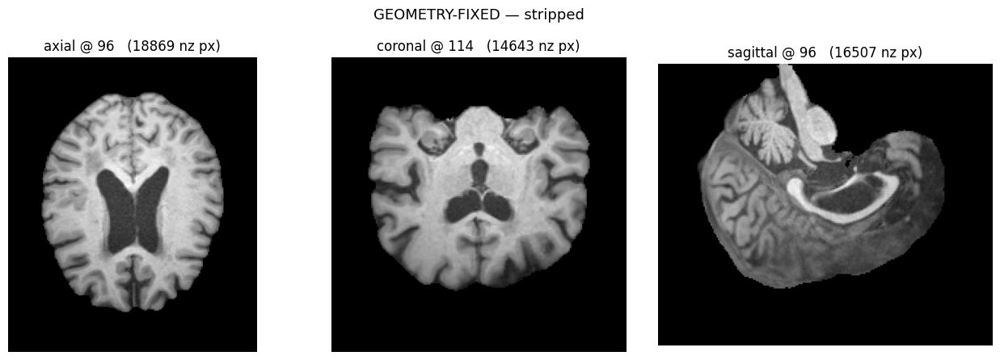

GEOMETRY-FIXED — cropped  shape=(100, 100, 100)  min=0.000  max=4.414  mean=2.178  nonzero=932314


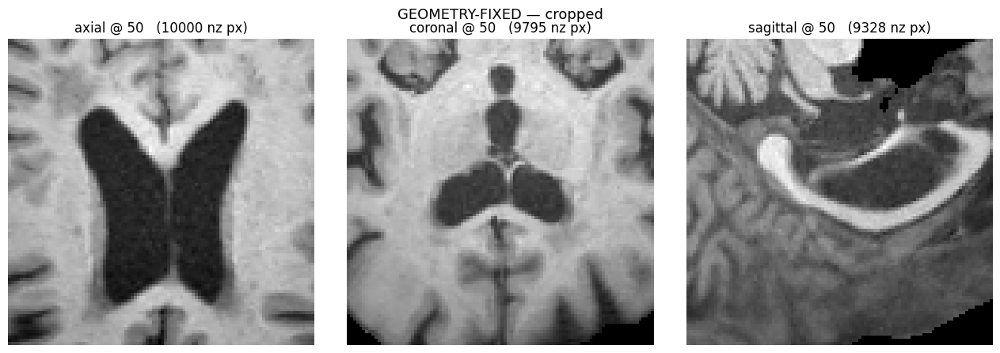

In [39]:
def _restore_geometry(rebuilt_img, reference_img):
    """Re-stamp spacing/origin that ants.from_numpy(..., direction=...) silently dropped."""
    return ants.from_numpy(rebuilt_img.numpy(), spacing=reference_img.spacing,
                            origin=reference_img.origin, direction=reference_img.direction)


def run_pipeline_steps_fixed(image_path, skip_skull_stripping=False, box=100, verbose=True):
    """Same as run_pipeline_steps, but restores spacing/origin after standardize + skull-strip."""
    stages = {}
    stages['raw'] = load_mri(path=image_path, as_ants=True)
    stages['standardized'] = _restore_geometry(clip_and_normalize_mri(stages['raw']), stages['raw'])
    stages['registered'] = register_image_with_atlas(stages['standardized'])
    if not skip_skull_stripping:
        stripped = deep_brain_skull_stripping(image=stages['registered'], probability=0.5, output_as_array=False)
        stages['stripped'] = _restore_geometry(stripped, stages['registered'])
    else:
        stages['stripped'] = stages['registered']
    stages['cropped'] = crop_mri_at_center(image=stages['stripped'], cropping_box=box)

    if verbose:
        for name, img in stages.items():
            print(f'{name:14} shape={img.shape}  spacing={tuple(round(s, 3) for s in img.spacing)}  '
                  f'origin={tuple(round(o, 2) for o in img.origin)}')
    return stages


stages_fixed = run_pipeline_steps_fixed(paths['raw_path'], skip_skull_stripping=False)
for name, img in stages_fixed.items():
    show_orthogonal(img, title=f'GEOMETRY-FIXED — {name}')

Found a total of 0 NaN values in image.
Running DeepBrain Skull Stripping...
DeepBrain skull stripping finished.
raw            shape=(192, 192, 160)  spacing=(1.251, 1.243, 1.201)  origin=(-90.68, -141.59, 108.53)
standardized   shape=(192, 192, 160)  spacing=(1.251, 1.243, 1.201)  origin=(-90.68, -141.59, 108.53)
registered     shape=(193, 229, 193)  spacing=(1.0, 1.0, 1.0)  origin=(96.0, 132.0, -74.0)
stripped       shape=(193, 229, 193)  spacing=(1.0, 1.0, 1.0)  origin=(96.0, 132.0, -74.0)
cropped        shape=(100, 100, 100)  spacing=(1.0, 1.0, 1.0)  origin=(49.0, 67.0, -27.0)
GEOMETRY-FIXED — raw  shape=(192, 192, 160)  min=0.000  max=2218.729  mean=173.616  nonzero=3813222


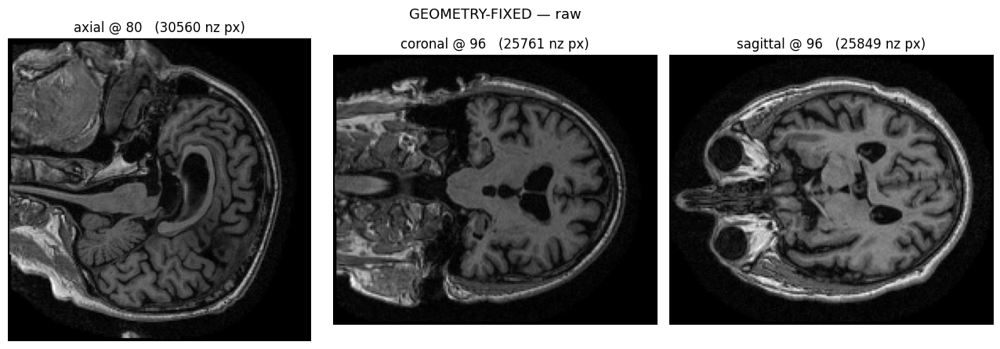

GEOMETRY-FIXED — standardized  shape=(192, 192, 160)  min=-0.001  max=12.370  mean=1.885  nonzero=5898240


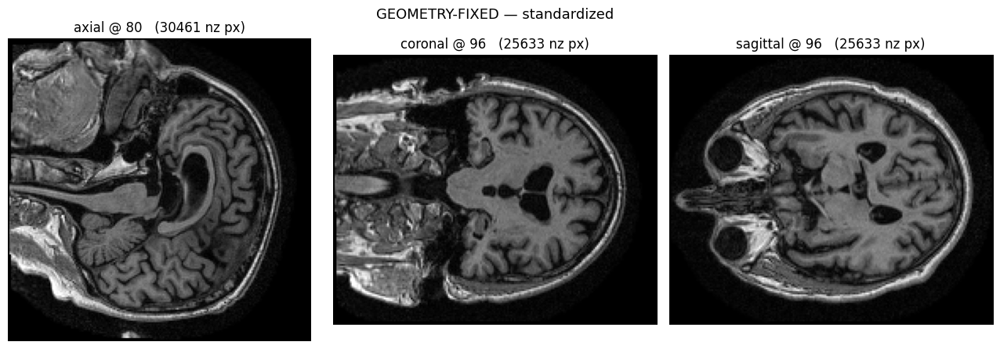

GEOMETRY-FIXED — registered  shape=(193, 229, 193)  min=-0.001  max=12.370  mean=1.949  nonzero=7912015


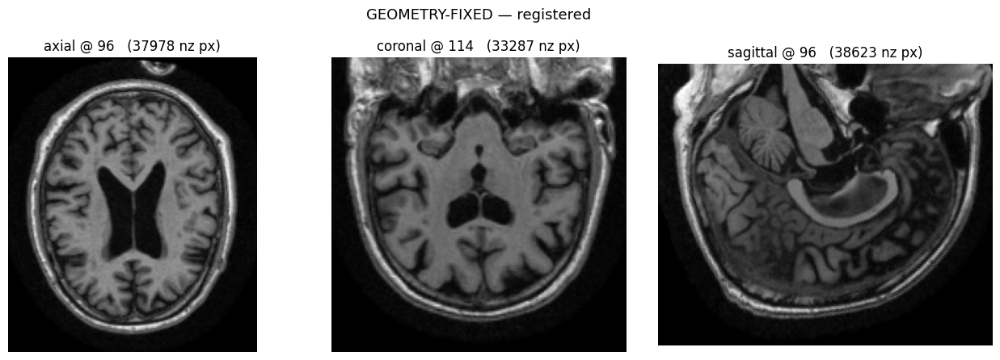

GEOMETRY-FIXED — stripped  shape=(193, 229, 193)  min=0.000  max=6.976  mean=0.784  nonzero=1735547


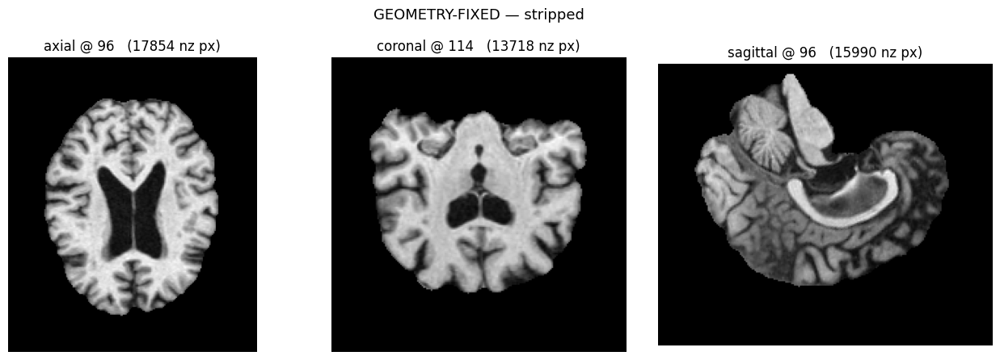

GEOMETRY-FIXED — cropped  shape=(100, 100, 100)  min=0.000  max=6.976  mean=3.621  nonzero=932092


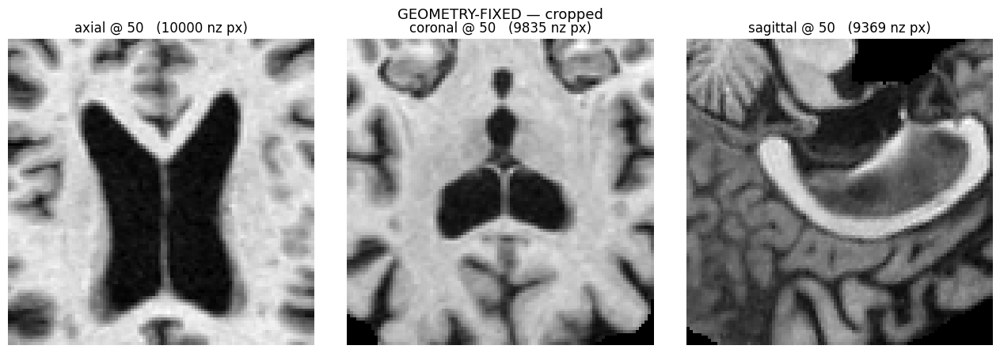

In [40]:
IMAGE_DATA_ID = 'I94615'   # <- any id in DOWNLOAD_RAW_MRI.csv. Try a DICOM one too, e.g. 'I11128519', to
                            #    compare against the "DCM images seem more deformed" hunch above.
paths = build_paths(IMAGE_DATA_ID)

stages_fixed = run_pipeline_steps_fixed(paths['raw_path'], skip_skull_stripping=False)
for name, img in stages_fixed.items():
    show_orthogonal(img, title=f'GEOMETRY-FIXED — {name}')

In [41]:
stages_fixed

{'raw': ANTsImage (SAR)
 	 Pixel Type : float (float32)
 	 Components : 1
 	 Dimensions : (192, 192, 160)
 	 Spacing    : (1.2507, 1.2433, 1.2007)
 	 Origin     : (-90.6771, -141.5904, 108.5301)
 	 Direction  : [-0. -0.  1. -0.  1.  0. -1. -0.  0.],
 'standardized': ANTsImage (SAR)
 	 Pixel Type : float (float32)
 	 Components : 1
 	 Dimensions : (192, 192, 160)
 	 Spacing    : (1.2507, 1.2433, 1.2007)
 	 Origin     : (-90.6771, -141.5904, 108.5301)
 	 Direction  : [-0. -0.  1. -0.  1.  0. -1. -0.  0.],
 'registered': ANTsImage (LPI)
 	 Pixel Type : float (float32)
 	 Components : 1
 	 Dimensions : (193, 229, 193)
 	 Spacing    : (1.0, 1.0, 1.0)
 	 Origin     : (96.0, 132.0, -74.0)
 	 Direction  : [-1.  0.  0.  0. -1.  0.  0.  0.  1.],
 'stripped': ANTsImage (LPI)
 	 Pixel Type : float (float32)
 	 Components : 1
 	 Dimensions : (193, 229, 193)
 	 Spacing    : (1.0, 1.0, 1.0)
 	 Origin     : (96.0, 132.0, -74.0)
 	 Direction  : [-1.  0.  0.  0. -1.  0.  0.  0.  1.],
 'cropped': ANTsIma

In [ ]:
stages_with_strip

{'raw': ANTsImage (SAR)
 	 Pixel Type : float (float32)
 	 Components : 1
 	 Dimensions : (256, 240, 208)
 	 Spacing    : (1.0, 1.0, 1.0)
 	 Origin     : (-104.837, -140.457, 81.33)
 	 Direction  : [ 0.  0.  1.  0.  1.  0. -1.  0.  0.],
 'standardized': ANTsImage (SAR)
 	 Pixel Type : float (float32)
 	 Components : 1
 	 Dimensions : (256, 240, 208)
 	 Spacing    : (1.0, 1.0, 1.0)
 	 Origin     : (0.0, 0.0, 0.0)
 	 Direction  : [ 0.  0.  1.  0.  1.  0. -1.  0.  0.],
 'registered': ANTsImage (LPI)
 	 Pixel Type : float (float32)
 	 Components : 1
 	 Dimensions : (193, 229, 193)
 	 Spacing    : (1.0, 1.0, 1.0)
 	 Origin     : (96.0, 132.0, -74.0)
 	 Direction  : [-1.  0.  0.  0. -1.  0.  0.  0.  1.],
 'stripped': ANTsImage (LPI)
 	 Pixel Type : float (float32)
 	 Components : 1
 	 Dimensions : (193, 229, 193)
 	 Spacing    : (1.0, 1.0, 1.0)
 	 Origin     : (0.0, 0.0, 0.0)
 	 Direction  : [-1.  0.  0.  0. -1.  0.  0.  0.  1.],
 'cropped': ANTsImage (LPI)
 	 Pixel Type : float (float32)
 	

{'raw': ANTsImage (SAR)
 	 Pixel Type : float (float32)
 	 Components : 1
 	 Dimensions : (192, 192, 160)
 	 Spacing    : (1.2507, 1.2433, 1.2007)
 	 Origin     : (-90.6771, -141.5904, 108.5301)
 	 Direction  : [-0. -0.  1. -0.  1.  0. -1. -0.  0.],
 'standardized': ANTsImage (SAR)
 	 Pixel Type : float (float32)
 	 Components : 1
 	 Dimensions : (192, 192, 160)
 	 Spacing    : (1.0, 1.0, 1.0)
 	 Origin     : (0.0, 0.0, 0.0)
 	 Direction  : [-0. -0.  1. -0.  1.  0. -1. -0.  0.],
 'registered': ANTsImage (LPI)
 	 Pixel Type : float (float32)
 	 Components : 1
 	 Dimensions : (193, 229, 193)
 	 Spacing    : (1.0, 1.0, 1.0)
 	 Origin     : (96.0, 132.0, -74.0)
 	 Direction  : [-1.  0.  0.  0. -1.  0.  0.  0.  1.],
 'stripped': ANTsImage (LPI)
 	 Pixel Type : float (float32)
 	 Components : 1
 	 Dimensions : (193, 229, 193)
 	 Spacing    : (1.0, 1.0, 1.0)
 	 Origin     : (0.0, 0.0, 0.0)
 	 Direction  : [-1.  0.  0.  0. -1.  0.  0.  0.  1.],
 'cropped': ANTsImage (LPI)
 	 Pixel Type : float